# Bayesian inversion of diffusivity in Poisson equation

In [1]:
import sys
import os
import time
import numpy as np
import dolfin as dl

import pickle

import torch

from scipy.interpolate import griddata

src_path = "../../../src/"
sys.path.append(src_path + 'plotting')
from field_plot import *
from plot_mix_collection import *
from point_plot import *
from plot_curve import plot_curve

model_path = "../../problems/poisson/"
sys.path.append(model_path)
from poissonModel import PoissonModel

sys.path.append(src_path + 'prior')
from priorSampler import PriorSampler

sys.path.append(src_path + 'mcmc')
from mcmc import MCMC
from mcmc_plot_fields import mcmc_plot_fields, mcmc_plot_fields_base
from compute_sample_errors import compute_sample_errors
from surrogateModel import SurrogateModel, SurrogateModelFNO

sys.path.append(src_path + 'nn/deeponet')
sys.path.append(src_path + 'data/')
sys.path.append(src_path + 'nn/mlp')
from load_data_and_deeponet import load_data_and_deeponet

sys.path.append(src_path + 'nn/pcanet')
from load_data_and_pcanet import load_data_and_pcanet

sys.path.append(src_path + 'nn/fno')
from load_data_and_fno import load_data_and_fno

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

# set seed
seed = 0
np.random.seed(seed)

In [2]:
model_data_folder = model_path + 'data/'
current_directory = os.getcwd()  
results_dir = current_directory + '/Results/'
if not os.path.exists(results_dir):
    os.makedirs(results_dir)

# Create PoissonModel

In [3]:
prior_ac = 0.005
prior_cc = 0.2
prior_logn_scale = 1
prior_logn_translate = 0.
nx, ny = 50, 50
fe_order = 1
data_prefix = 'Poisson'

# create mesh
mesh = dl.UnitSquareMesh(nx, ny)

# create function spaces
Vm = dl.FunctionSpace(mesh, 'Lagrange', fe_order)
Vu = Vm

# create prior sampler
prior_sampler = PriorSampler(Vm, prior_ac, prior_cc, seed)

# create model
model = PoissonModel(Vm, Vu, prior_sampler, prior_logn_scale, prior_logn_translate, seed)

# Load Neural Operators

In [4]:
surrogate_models = None
load_surrogate = False

In [5]:
if load_surrogate:
    def load_deeponet():
        data_path = model_path + 'data/' + 'Poisson_samples.npz'
        nn_path = model_path + 'DeepONet/Results/model.pkl'
        data, nn = load_data_and_deeponet(data_path, nn_path)
        nn_surrogate = SurrogateModel(model, nn, data)
        print('nn_data: ', data)
        print('nn_model: ', nn)

        return nn_surrogate

    deeponet = load_deeponet()

In [6]:
if load_surrogate:
    def load_pcanet():
        data_path = model_path + 'data/' + 'Poisson_samples.npz'
        nn_path = model_path + 'PCANet/Results/model.pkl'
        data, nn = load_data_and_pcanet(data_path, nn_path)
        nn_surrogate = SurrogateModel(model, nn, data)
        print('nn_data: ', data)
        print('nn_model: ', nn)

        return nn_surrogate

    pcanet = load_pcanet()  

In [7]:
if load_surrogate:
    def load_fno():
        data_path = model_path + 'data/' + 'Poisson_FNO_samples.npz'
        nn_path = model_path + 'FNO/Results/model.pkl'
        data, nn = load_data_and_fno(data_path, nn_path)
        # get some additional data for FNO
        nodes = deeponet.data.X_trunk
        grid_x = data.grid_x_test[0, :, :, 0]
        grid_y = data.grid_y_test[0, :, :, 0]
        nn_surrogate = SurrogateModelFNO(model, nn, data, nodes, grid_x, grid_y, u_comps = 1)
        print('nn_data: ', data)
        print('nn_model: ', nn)

        return nn_surrogate

    fno = load_fno()

In [8]:
if load_surrogate:
    surrogate_models = {'DeepONet': deeponet, 'PCANet': pcanet, 'FNO': fno}

In [9]:
if load_surrogate:
    t1 = time.time()
    w1 = model.samplePrior(transform_m = False)
    w2 = w1.copy()
    t2 = time.time()
    print('Time to sample m: {:.3f}'.format(t2 - t1))

    # model solver
    t1 = time.time()
    m = model.transform_gaussian_pointwise(w1)
    u_model = model.solveFwd(u = None, m = m, transform_m = False)
    t2 = time.time()
    print('Time to solve LinearElasticity model forward: {:.3f}'.format(t2 - t1))

    # neural operators
    sm_use = ['DeepONet', 'PCANet', 'FNO']
    for sm in sm_use:
        t1 = time.time()
        u_sm = surrogate_models[sm].solveFwd(w2)
        t2 = time.time()
        u_err = np.linalg.norm(u_model - u_sm) / np.linalg.norm(u_model)
        print('Time to solve {} forward: {:.3f}, err: {:.3e}'.format(surrogate_models[sm].model_type, t2 - t1, u_err))

# Get ground truth

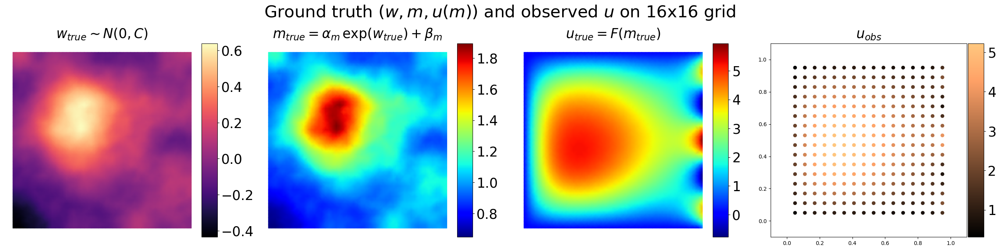

In [10]:
# load
ground_truth_data = np.load(results_dir + 'ground_truth/data.npz')
num_grid_x, num_grid_y = ground_truth_data['num_grid_x'], ground_truth_data['num_grid_y']
w_true = ground_truth_data['w_true']
m_true = ground_truth_data['m_true']
u_true = ground_truth_data['u_true']
x_obs = ground_truth_data['x_obs']
u_obs = ground_truth_data['u_obs']


rows, cols = 1, 4
fig, axs = plt.subplots(rows, cols, figsize=(26, 6))
axs = np.array([axs]) if rows == 1 else axs

uvec = [[w_true, m_true, u_true]]
title_vec = [[r'$w_{true} \sim N(0, C)$', r'$m_{true} = \alpha_m\, \exp(w_{true}) + \beta_m$', r'$u_{true} = F(m_{true})$', r'$u_{obs}$']]
cmap_vec = [['magma', 'jet', 'jet', 'copper']]
sup_title = r'Ground truth $(w, m, u(m))$ and observed $u$ on {}x{} grid'.format(num_grid_x, num_grid_y)
fs = 25
y_sup_title = 1.075
savefilename = results_dir + 'true_and_obs_w_m_u.png'

nodes = model.Vm.mesh().coordinates()


for i in range(rows):
    for j in range(cols):

        # add grid points
        if j == cols - 1:
            axs[i,j].set_xlim([-0.1, 1.1])
            axs[i,j].set_ylim([-0.1, 1.1])
        
        if j < cols - 1:
            cbar = field_plot(axs[i,j], \
                uvec[i][j], \
                nodes, cmap = cmap_vec[i][j])
        else:
            cbar = point_plot(axs[i,j], u_obs, x_obs, cmap = cmap_vec[i][j])
        divider = make_axes_locatable(axs[i,j])
        cax = divider.append_axes('right', size='8%', pad=0.03)
        cax.tick_params(labelsize=fs)
        cbar = fig.colorbar(cbar, cax=cax, orientation='vertical')
        if j < cols - 1:
            axs[i,j].axis('off')
        if title_vec is not None:
            axs[i,j].set_title(title_vec[i][j], fontsize=fs, pad=10)        

fig.tight_layout()
if sup_title is not None:
    fig.suptitle(sup_title, fontsize=1.25*fs, y = y_sup_title)
if savefilename is not None:
    plt.savefig(savefilename,  bbox_inches='tight')
plt.show()

## Compute noise

In [40]:
u_obs_mean, u_obs_std = np.mean(u_obs), np.std(u_obs)
sigma_noise = 0.05 * u_obs_mean
print('u_obs_mean = {:.3e}, u_obs_std = {:.3e}, sigma_noise: {:.3e}'.format(u_obs_mean, u_obs_std, sigma_noise))

u_obs_mean = 2.785e+00, u_obs_std = 1.329e+00, sigma_noise: 1.393e-01


# Bayesian parameter estimation setup

In [41]:
surrogate_to_use = None

mcmc = MCMC(model, prior_sampler, ground_truth_data, \
            sigma_noise = sigma_noise, pcn_beta = 0.2, \
            surrogate_to_use = surrogate_to_use, \
            surrogate_models = surrogate_models, \
            seed = seed)

# display low-res files for testing
mcmc.pp_params = {'curve_plot': {'fs': 12, 'lw': 3, 'figsize': (4,3)}, \
                          'field_plot': {'fs': 10, 'y_sup_title': 1.025, 'figsize': (8, 6), 'ttl_pad': 5}}

In [42]:
n_samples = 10000
n_burnin = 500
pcn_beta = 0.2
print_every = 500
display_plot_every = 5*print_every

mcmc.surrogate_to_use = None

savepath_base = results_dir + 'test_mcmc_results_n_samples_{:d}_n_burnin_{:d}_pcn_beta_{:.3f}_sigma_{:.3e}'.format(n_samples, n_burnin, pcn_beta, sigma_noise)

if mcmc.surrogate_to_use is not None:
    savepath = savepath_base + '_surrogate_{}/'.format(mcmc.surrogate_to_use)
else:
    savepath = savepath_base + '/'

os.makedirs(savepath, exist_ok = True)

savefilename = 'tracer'

## True model

--------------------------------------------------
MCMC started with 10000 samples and 500 burnin
PCN beta: 2.000e-01, sigma_noise: 1.393e-01
Model used for solving the forward problem: True Model
Tracer save path: test_mcmc_results_n_samples_10000_n_burnin_500_pcn_beta_0.200_sigma_1.393e-01
Tracer save filename: tracer
--------------------------------------------------
initializing the current state. Initial cost: 1.350e+03
--------------------------------------------------
Burnin:    0, Cost: 1.140e+03
--------------------------------------------------
--------------------------------------------------
Sample:  500, Accepted samples:    0, Acceptance Rate: 0.000e+00, Cost mean: 0.000e+00. 
Tracing 500 samples took 2.982e+01s
Error (%) in w: ||w - w_mean|| = 1.000e+02, ||w - w_sample|| = 1.000e+02
Error (%) in m: ||m - m_mean|| = 2.244e+01, ||m - m_sample|| = 2.244e+01
Error (%) in u: ||u - u_mean|| = 5.482e+00, ||u - u_sample|| = 5.482e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| =

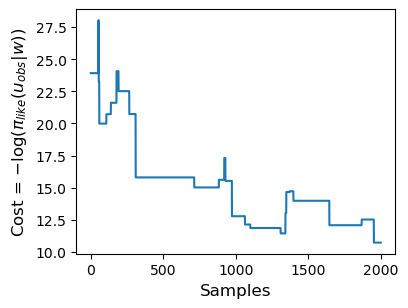

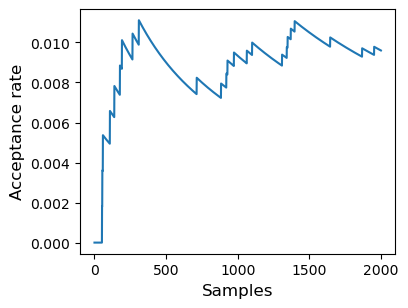

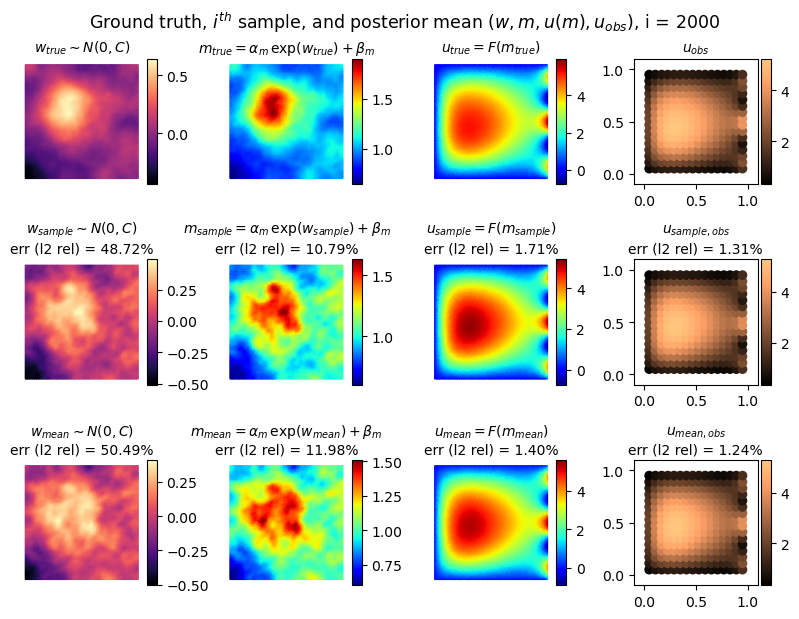

--------------------------------------------------
Sample: 3000, Accepted samples:   29, Acceptance Rate: 9.667e-03, Cost mean: 1.423e+01. 
Tracing 500 samples took 4.182e+01s
Error (%) in w: ||w - w_mean|| = 4.839e+01, ||w - w_sample|| = 4.863e+01
Error (%) in m: ||m - m_mean|| = 1.142e+01, ||m - m_sample|| = 1.033e+01
Error (%) in u: ||u - u_mean|| = 1.350e+00, ||u - u_sample|| = 1.570e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.174e+00, ||u_obs - u_obs_sample|| = 1.505e+00
--------------------------------------------------
--------------------------------------------------
Sample: 3500, Accepted samples:   37, Acceptance Rate: 1.057e-02, Cost mean: 1.438e+01. 
Tracing 500 samples took 4.506e+01s
Error (%) in w: ||w - w_mean|| = 4.689e+01, ||w - w_sample|| = 5.132e+01
Error (%) in m: ||m - m_mean|| = 1.106e+01, ||m - m_sample|| = 1.163e+01
Error (%) in u: ||u - u_mean|| = 1.330e+00, ||u - u_sample|| = 1.727e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.158e+00, ||u_obs - 

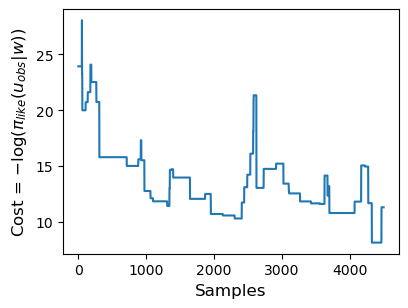

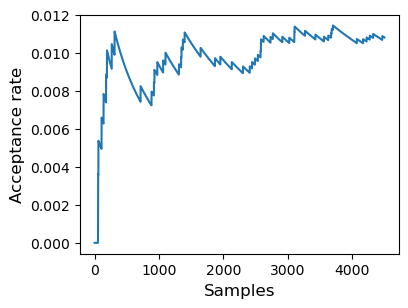

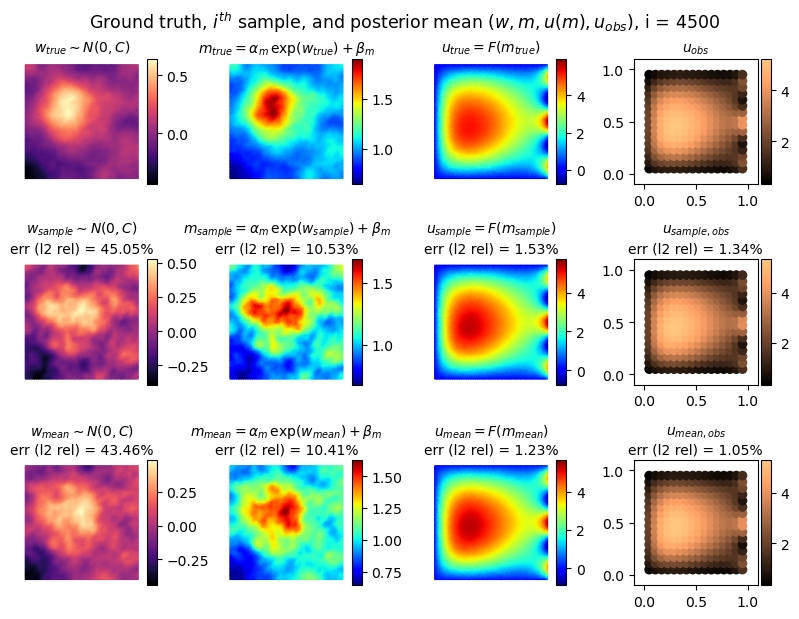

--------------------------------------------------
Sample: 5500, Accepted samples:   61, Acceptance Rate: 1.109e-02, Cost mean: 1.333e+01. 
Tracing 500 samples took 8.004e+01s
Error (%) in w: ||w - w_mean|| = 4.254e+01, ||w - w_sample|| = 5.059e+01
Error (%) in m: ||m - m_mean|| = 1.025e+01, ||m - m_sample|| = 1.158e+01
Error (%) in u: ||u - u_mean|| = 1.196e+00, ||u - u_sample|| = 1.461e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.023e+00, ||u_obs - u_obs_sample|| = 1.396e+00
--------------------------------------------------
--------------------------------------------------
Sample: 6000, Accepted samples:   66, Acceptance Rate: 1.100e-02, Cost mean: 1.307e+01. 
Tracing 500 samples took 7.602e+01s
Error (%) in w: ||w - w_mean|| = 4.143e+01, ||w - w_sample|| = 4.686e+01
Error (%) in m: ||m - m_mean|| = 1.002e+01, ||m - m_sample|| = 1.051e+01
Error (%) in u: ||u - u_mean|| = 1.158e+00, ||u - u_sample|| = 1.499e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.960e-01, ||u_obs - 

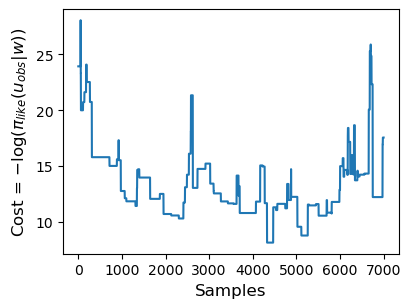

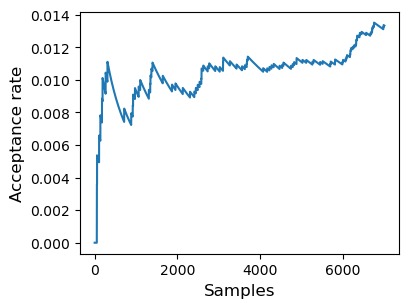

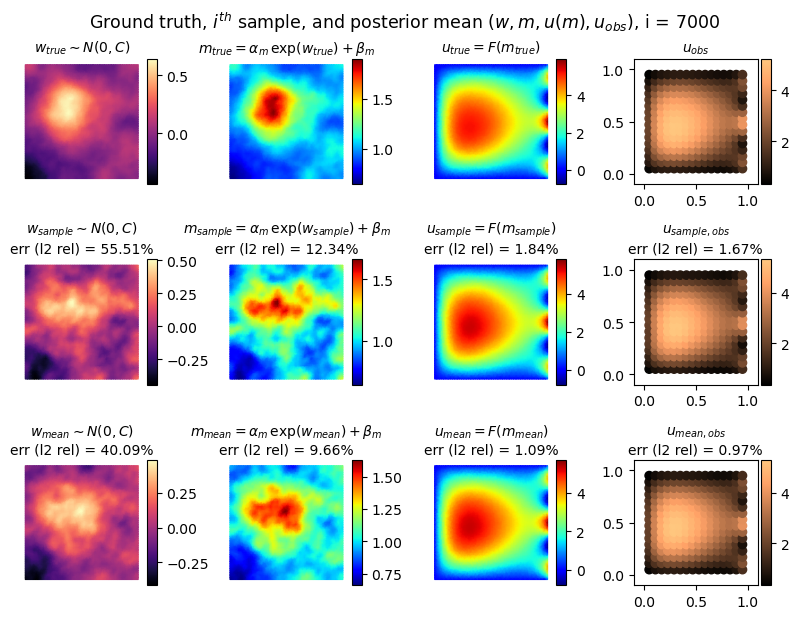

--------------------------------------------------
Sample: 8000, Accepted samples:  107, Acceptance Rate: 1.337e-02, Cost mean: 1.350e+01. 
Tracing 500 samples took 8.675e+01s
Error (%) in w: ||w - w_mean|| = 4.011e+01, ||w - w_sample|| = 5.915e+01
Error (%) in m: ||m - m_mean|| = 9.614e+00, ||m - m_sample|| = 1.249e+01
Error (%) in u: ||u - u_mean|| = 1.077e+00, ||u - u_sample|| = 1.807e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.718e-01, ||u_obs - u_obs_sample|| = 1.617e+00
--------------------------------------------------
--------------------------------------------------
Sample: 8500, Accepted samples:  123, Acceptance Rate: 1.447e-02, Cost mean: 1.369e+01. 
Tracing 500 samples took 8.463e+01s
Error (%) in w: ||w - w_mean|| = 4.025e+01, ||w - w_sample|| = 5.009e+01
Error (%) in m: ||m - m_mean|| = 9.633e+00, ||m - m_sample|| = 1.084e+01
Error (%) in u: ||u - u_mean|| = 1.075e+00, ||u - u_sample|| = 1.685e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.707e-01, ||u_obs - 

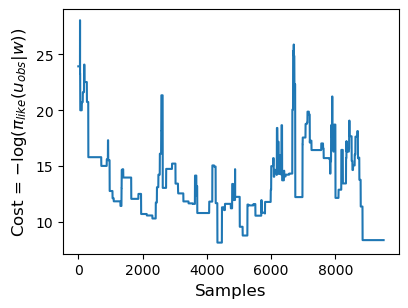

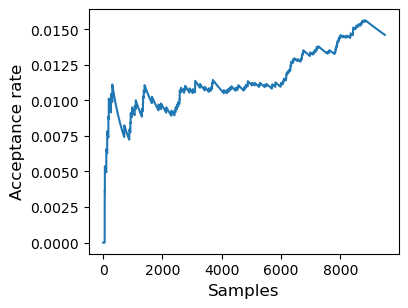

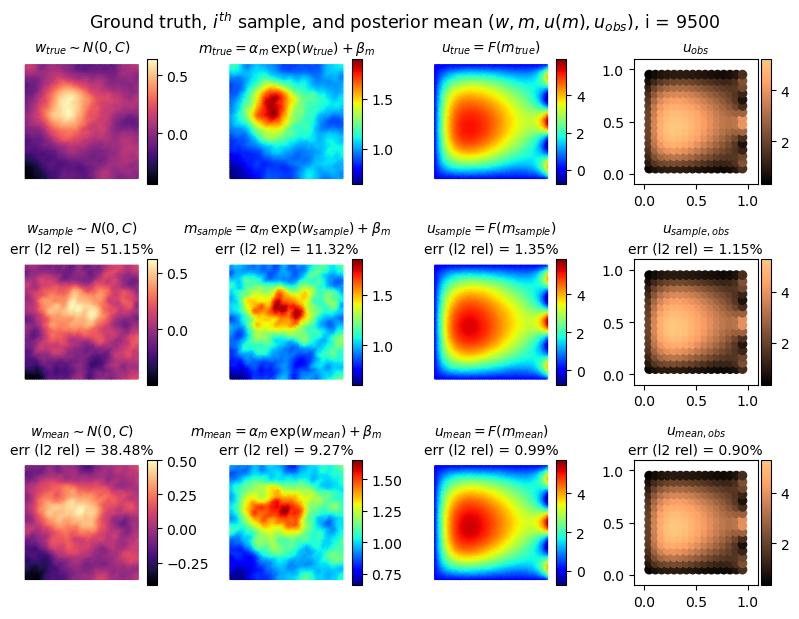

--------------------------------------------------
MCMC finished in 1.416e+03s. 
Total samples: 10500, Accepted samples:  150, Acceptance Rate: 1.429e-02, Cost mean: 1.317e+01
--------------------------------------------------


In [43]:
run_mcmc = True

if run_mcmc:
    mcmc.run(n_samples = n_samples, n_burnin = n_burnin, \
         pcn_beta = pcn_beta, sigma_noise = sigma_noise, \
         print_every = print_every, print_lvl = 2, \
         display_plot_every = display_plot_every, \
         savefilename = savefilename, \
         init_tracer = True, \
         savepath = savepath)

### Load tracer and plot

In [15]:
load_tracer = pickle.load(open(savepath + 'tracer' + '.pkl', 'rb'))

load_tracer.acceptances, load_tracer.current_acceptance_rate

mcmc_pp_params = {'curve_plot': {'fs': 20, 'lw': 3, 'figsize': (6,4)}, \
                          'field_plot': {'fs': 24, 'y_sup_title': 1.075, 'figsize': (20, 12), 'ttl_pad': 10, 'u_vec_plot': True}}

savefig = False
pp_params = mcmc_pp_params['curve_plot']
plot_curve(load_tracer.accepted_samples_cost, xl=r'Samples', \
        yl= r'Cost = $-\log(\pi_{like}(u_{obs} | w))$', \
        fs = pp_params['fs'], lw = pp_params['lw'], figsize=pp_params['figsize'])

plot_curve(load_tracer.acceptance_rate, xl=r'Samples', \
        yl= r'Acceptance rate', \
        fs = pp_params['fs'], lw = pp_params['lw'], figsize=pp_params['figsize'])


w_mean = load_tracer.accepted_samples_mean_m
w_sample_i = len(load_tracer.accepted_samples_m) - 1
w_sample = load_tracer.accepted_samples_m[w_sample_i]

pp_params = mcmc_pp_params['field_plot']
pp_params['sup_title'] = r'Ground truth, posterior sample' \
            + r', and posterior mean $(w, m, u(m), u_{obs})$'
mcmc_plot_fields_base(w_mean, w_sample, w_sample_i, mcmc, savefilename = None, params = pp_params)

FileNotFoundError: [Errno 2] No such file or directory: '/home/prashant/Dropbox/Work/Simulations/neuralnet_works/error_corrector_direction/neural_operators/survey_work/applications/bayesian_inverse_problem_poisson/Results/test_mcmc_results_n_samples_10000_n_burnin_500_pcn_beta_0.200_sigma_1.393e-01/tracer.pkl'

### DeepONet

In [16]:
mcmc.surrogate_to_use = 'DeepONet'

if mcmc.surrogate_to_use is not None:
    savepath = savepath_base + '_surrogate_{}/'.format(mcmc.surrogate_to_use)
else:
    savepath = savepath_base + '/'

os.makedirs(savepath, exist_ok = True)

savefilename = 'tracer'

run_mcmc = False
if run_mcmc:
    mcmc.run(n_samples = n_samples, n_burnin = n_burnin, \
         pcn_beta = pcn_beta, sigma_noise = sigma_noise, \
         print_every = print_every, print_lvl = 2, \
         display_plot_every = display_plot_every, \
         savefilename = savefilename, \
         savepath = savepath, init_tracer = True)

### PCANet

In [17]:
mcmc.surrogate_to_use = 'PCANet'

if mcmc.surrogate_to_use is not None:
    savepath = savepath_base + '_surrogate_{}/'.format(mcmc.surrogate_to_use)
else:
    savepath = savepath_base + '/'

os.makedirs(savepath, exist_ok = True)

savefilename = 'tracer'

run_mcmc = False
if run_mcmc:
    mcmc.run(n_samples = n_samples, n_burnin = n_burnin, \
         pcn_beta = pcn_beta, sigma_noise = sigma_noise, \
         print_every = print_every, print_lvl = 2, \
         display_plot_every = display_plot_every, \
         savefilename = savefilename, \
         savepath = savepath, init_tracer = True)

### FNO

--------------------------------------------------
MCMC started with 10000 samples and 500 burnin
PCN beta: 2.000e-01, sigma_noise: 1.393e-01
Model used for solving the forward problem: FNO
Tracer save path: test_mcmc_results_n_samples_10000_n_burnin_500_pcn_beta_0.200_sigma_1.393e-01_surrogate_FNO
Tracer save filename: tracer
--------------------------------------------------
initializing the current state. Initial cost: 2.522e+03
--------------------------------------------------
Burnin:    0, Cost: 2.522e+03
--------------------------------------------------
--------------------------------------------------
Burnin:  100, Cost: 5.354e+01
--------------------------------------------------
--------------------------------------------------
Burnin:  200, Cost: 4.681e+01
--------------------------------------------------
--------------------------------------------------
Burnin:  300, Cost: 2.533e+01
--------------------------------------------------
------------------------------------

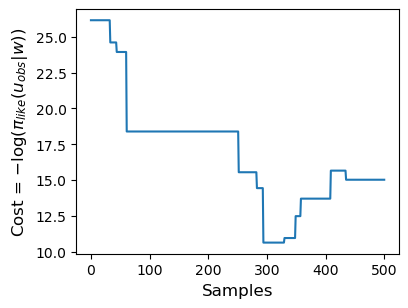

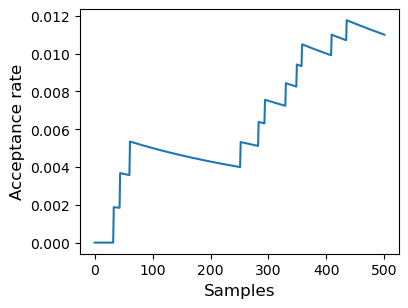

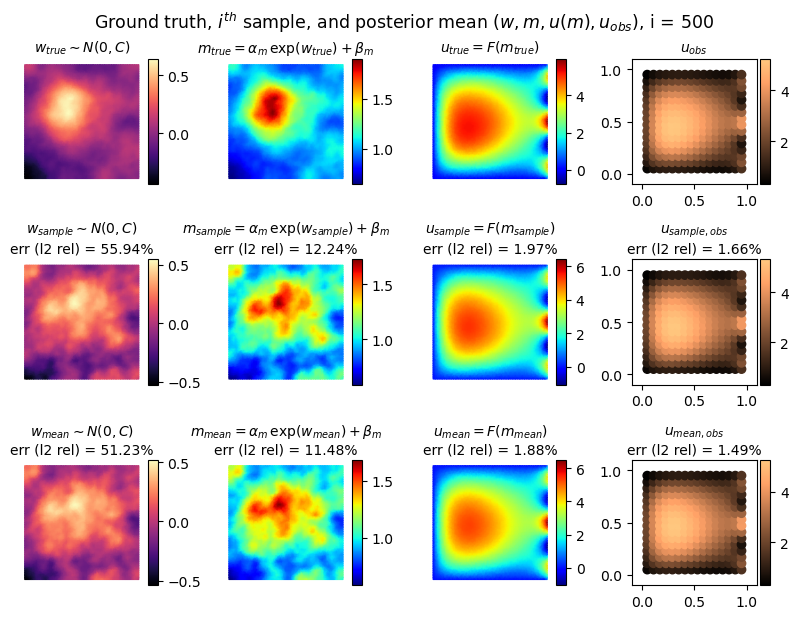

--------------------------------------------------
Sample: 1100, Accepted samples:   11, Acceptance Rate: 1.000e-02, Cost mean: 1.666e+01. 
Tracing 100 samples took 3.030e+01s
Error (%) in w: ||w - w_mean|| = 5.127e+01, ||w - w_sample|| = 5.594e+01
Error (%) in m: ||m - m_mean|| = 1.147e+01, ||m - m_sample|| = 1.224e+01
Error (%) in u: ||u - u_mean|| = 1.846e+00, ||u - u_sample|| = 1.974e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.463e+00, ||u_obs - u_obs_sample|| = 1.660e+00
--------------------------------------------------
--------------------------------------------------
Sample: 1200, Accepted samples:   13, Acceptance Rate: 1.083e-02, Cost mean: 1.638e+01. 
Tracing 100 samples took 2.597e+01s
Error (%) in w: ||w - w_mean|| = 5.134e+01, ||w - w_sample|| = 5.285e+01
Error (%) in m: ||m - m_mean|| = 1.146e+01, ||m - m_sample|| = 1.132e+01
Error (%) in u: ||u - u_mean|| = 1.838e+00, ||u - u_sample|| = 2.000e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.459e+00, ||u_obs - 

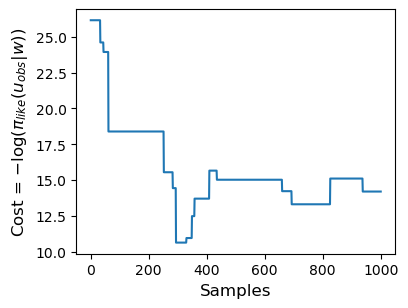

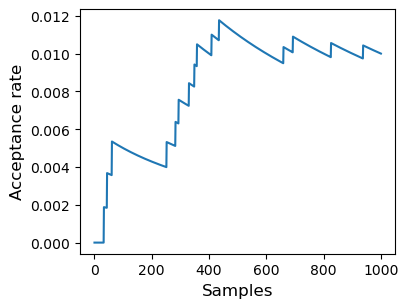

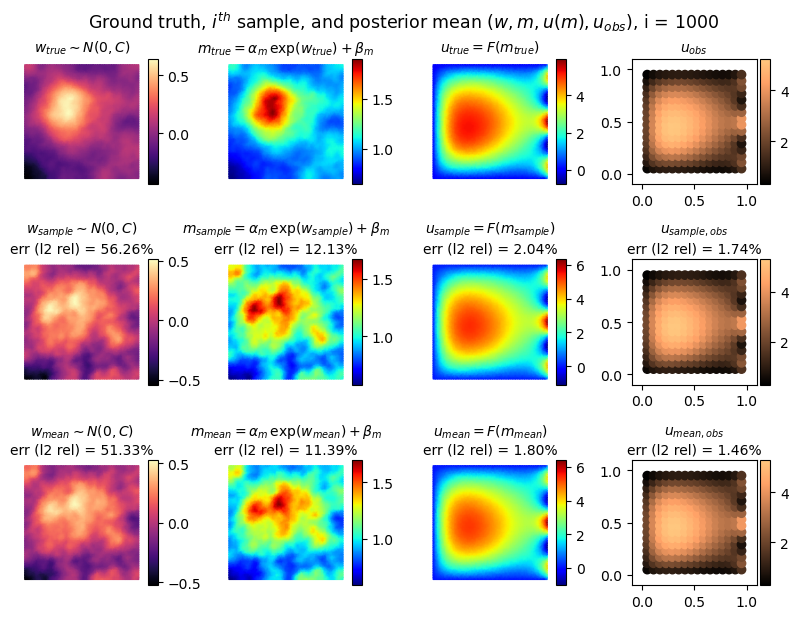

--------------------------------------------------
Sample: 1600, Accepted samples:   16, Acceptance Rate: 1.000e-02, Cost mean: 1.556e+01. 
Tracing 100 samples took 3.042e+01s
Error (%) in w: ||w - w_mean|| = 5.145e+01, ||w - w_sample|| = 5.823e+01
Error (%) in m: ||m - m_mean|| = 1.140e+01, ||m - m_sample|| = 1.236e+01
Error (%) in u: ||u - u_mean|| = 1.785e+00, ||u - u_sample|| = 1.768e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.450e+00, ||u_obs - u_obs_sample|| = 1.560e+00
--------------------------------------------------
--------------------------------------------------
Sample: 1700, Accepted samples:   16, Acceptance Rate: 9.412e-03, Cost mean: 1.543e+01. 
Tracing 100 samples took 2.701e+01s
Error (%) in w: ||w - w_mean|| = 5.162e+01, ||w - w_sample|| = 5.823e+01
Error (%) in m: ||m - m_mean|| = 1.141e+01, ||m - m_sample|| = 1.236e+01
Error (%) in u: ||u - u_mean|| = 1.753e+00, ||u - u_sample|| = 1.768e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.432e+00, ||u_obs - 

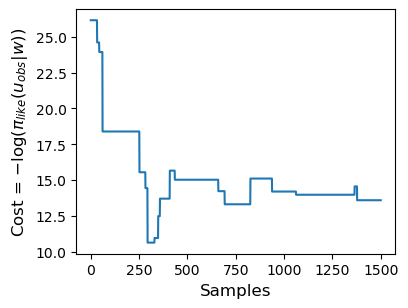

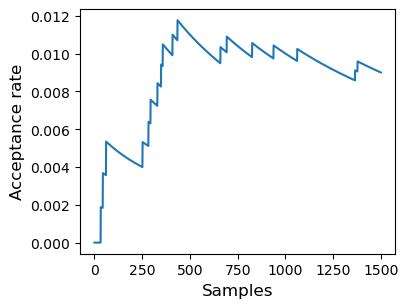

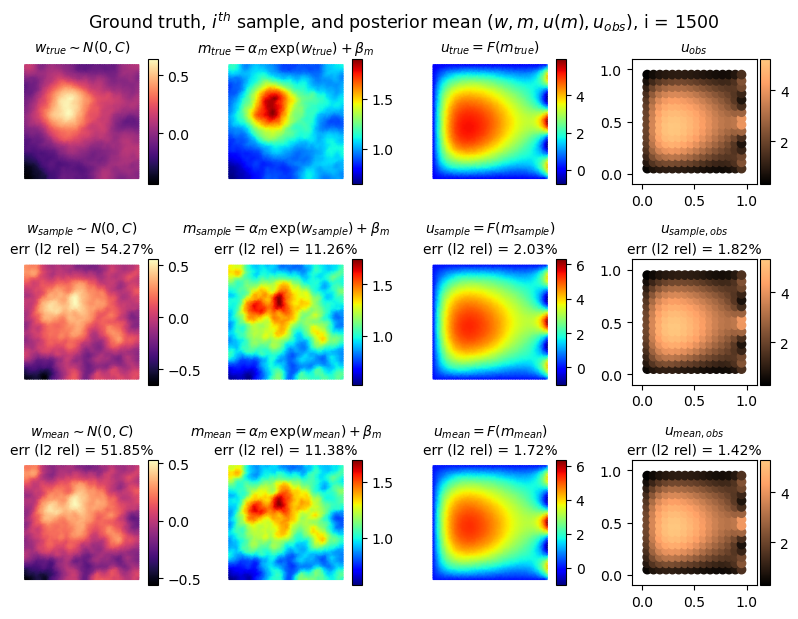

--------------------------------------------------
Sample: 2100, Accepted samples:   19, Acceptance Rate: 9.048e-03, Cost mean: 1.503e+01. 
Tracing 100 samples took 3.108e+01s
Error (%) in w: ||w - w_mean|| = 5.178e+01, ||w - w_sample|| = 5.495e+01
Error (%) in m: ||m - m_mean|| = 1.134e+01, ||m - m_sample|| = 1.140e+01
Error (%) in u: ||u - u_mean|| = 1.721e+00, ||u - u_sample|| = 2.126e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.430e+00, ||u_obs - u_obs_sample|| = 1.713e+00
--------------------------------------------------
--------------------------------------------------
Sample: 2200, Accepted samples:   20, Acceptance Rate: 9.091e-03, Cost mean: 1.483e+01. 
Tracing 100 samples took 2.835e+01s
Error (%) in w: ||w - w_mean|| = 5.175e+01, ||w - w_sample|| = 5.542e+01
Error (%) in m: ||m - m_mean|| = 1.133e+01, ||m - m_sample|| = 1.204e+01
Error (%) in u: ||u - u_mean|| = 1.698e+00, ||u - u_sample|| = 1.638e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.411e+00, ||u_obs - 

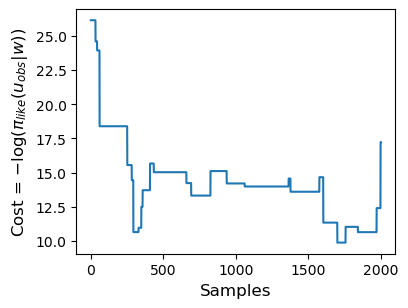

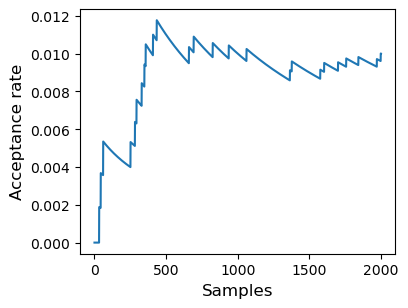

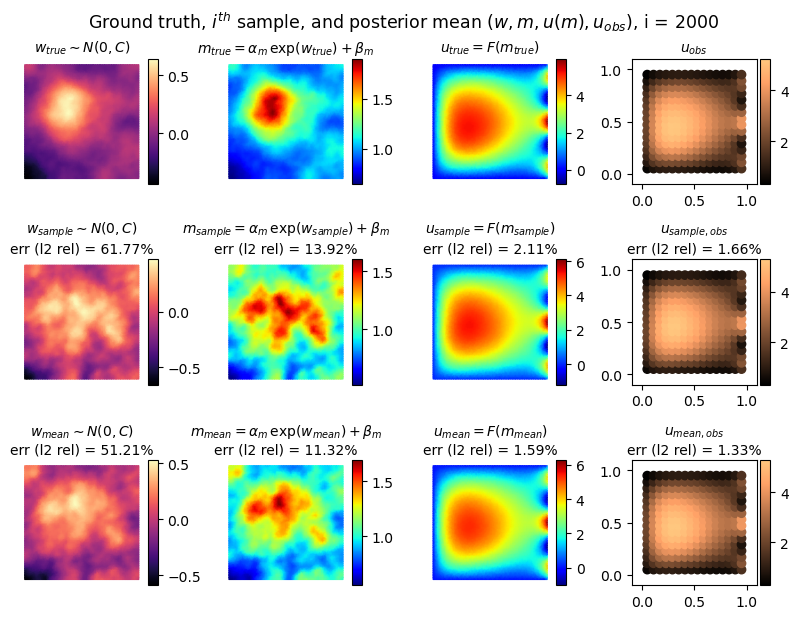

--------------------------------------------------
Sample: 2600, Accepted samples:   26, Acceptance Rate: 1.000e-02, Cost mean: 1.427e+01. 
Tracing 100 samples took 3.320e+01s
Error (%) in w: ||w - w_mean|| = 5.126e+01, ||w - w_sample|| = 6.333e+01
Error (%) in m: ||m - m_mean|| = 1.138e+01, ||m - m_sample|| = 1.454e+01
Error (%) in u: ||u - u_mean|| = 1.565e+00, ||u - u_sample|| = 1.987e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.299e+00, ||u_obs - u_obs_sample|| = 1.557e+00
--------------------------------------------------
--------------------------------------------------
Sample: 2700, Accepted samples:   28, Acceptance Rate: 1.037e-02, Cost mean: 1.434e+01. 
Tracing 100 samples took 2.993e+01s
Error (%) in w: ||w - w_mean|| = 5.132e+01, ||w - w_sample|| = 6.685e+01
Error (%) in m: ||m - m_mean|| = 1.144e+01, ||m - m_sample|| = 1.578e+01
Error (%) in u: ||u - u_mean|| = 1.538e+00, ||u - u_sample|| = 1.841e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.277e+00, ||u_obs - 

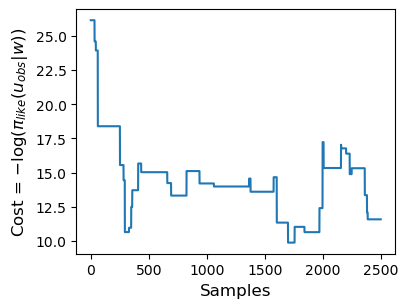

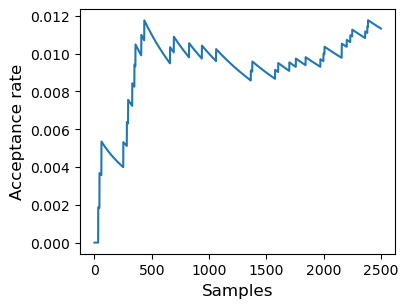

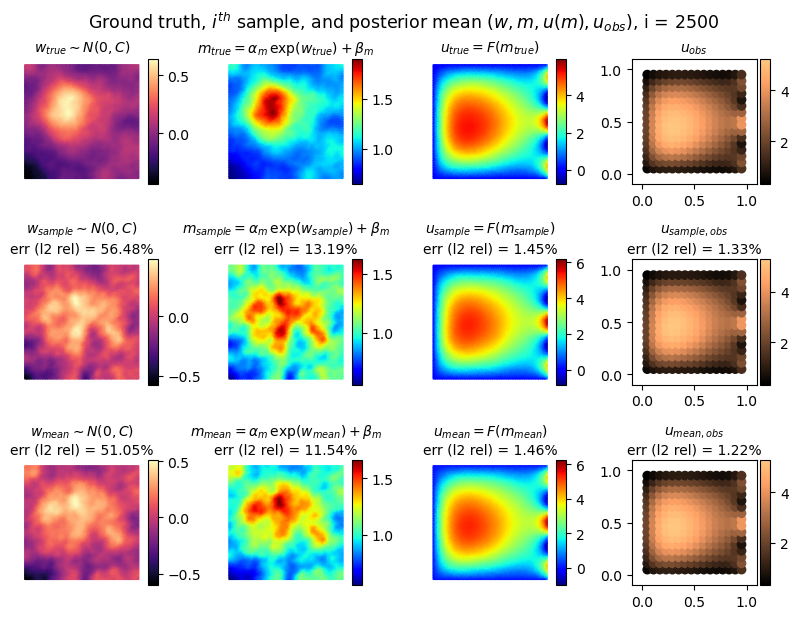

--------------------------------------------------
Sample: 3100, Accepted samples:   35, Acceptance Rate: 1.129e-02, Cost mean: 1.419e+01. 
Tracing 100 samples took 3.428e+01s
Error (%) in w: ||w - w_mean|| = 5.080e+01, ||w - w_sample|| = 5.643e+01
Error (%) in m: ||m - m_mean|| = 1.153e+01, ||m - m_sample|| = 1.304e+01
Error (%) in u: ||u - u_mean|| = 1.432e+00, ||u - u_sample|| = 1.516e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.197e+00, ||u_obs - u_obs_sample|| = 1.403e+00
--------------------------------------------------
--------------------------------------------------
Sample: 3200, Accepted samples:   35, Acceptance Rate: 1.094e-02, Cost mean: 1.409e+01. 
Tracing 100 samples took 2.999e+01s
Error (%) in w: ||w - w_mean|| = 5.057e+01, ||w - w_sample|| = 5.643e+01
Error (%) in m: ||m - m_mean|| = 1.151e+01, ||m - m_sample|| = 1.304e+01
Error (%) in u: ||u - u_mean|| = 1.412e+00, ||u - u_sample|| = 1.516e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.185e+00, ||u_obs - 

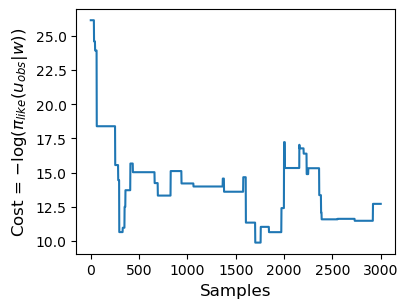

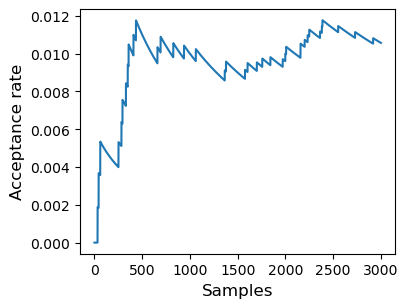

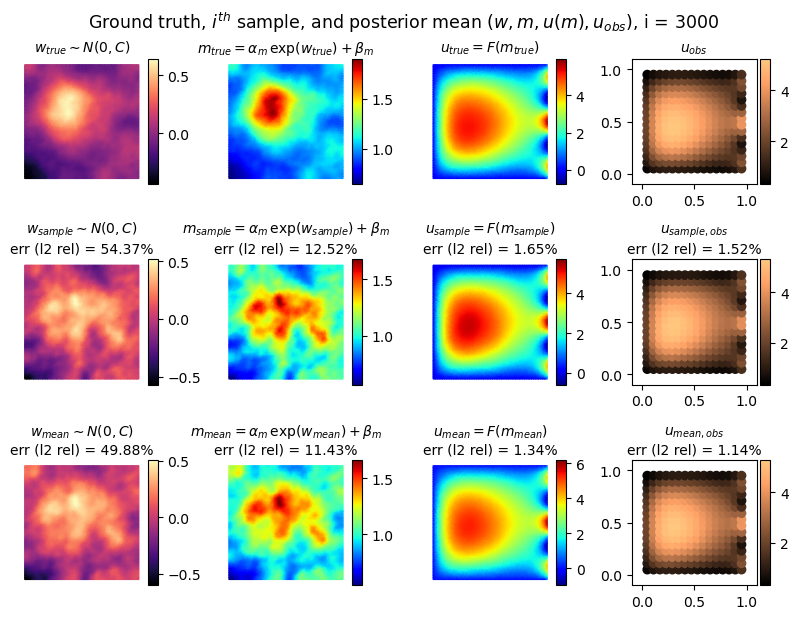

--------------------------------------------------
Sample: 3600, Accepted samples:   41, Acceptance Rate: 1.139e-02, Cost mean: 1.378e+01. 
Tracing 100 samples took 3.466e+01s
Error (%) in w: ||w - w_mean|| = 4.958e+01, ||w - w_sample|| = 5.358e+01
Error (%) in m: ||m - m_mean|| = 1.138e+01, ||m - m_sample|| = 1.206e+01
Error (%) in u: ||u - u_mean|| = 1.316e+00, ||u - u_sample|| = 1.542e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.124e+00, ||u_obs - u_obs_sample|| = 1.276e+00
--------------------------------------------------
--------------------------------------------------
Sample: 3700, Accepted samples:   42, Acceptance Rate: 1.135e-02, Cost mean: 1.365e+01. 
Tracing 100 samples took 3.090e+01s
Error (%) in w: ||w - w_mean|| = 4.933e+01, ||w - w_sample|| = 5.379e+01
Error (%) in m: ||m - m_mean|| = 1.133e+01, ||m - m_sample|| = 1.215e+01
Error (%) in u: ||u - u_mean|| = 1.298e+00, ||u - u_sample|| = 1.314e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.113e+00, ||u_obs - 

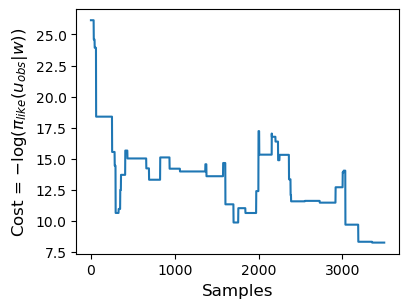

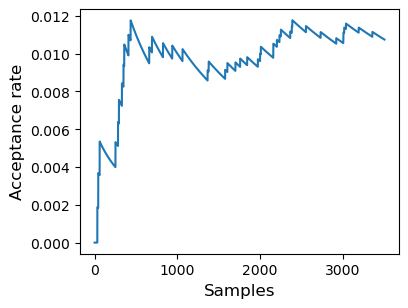

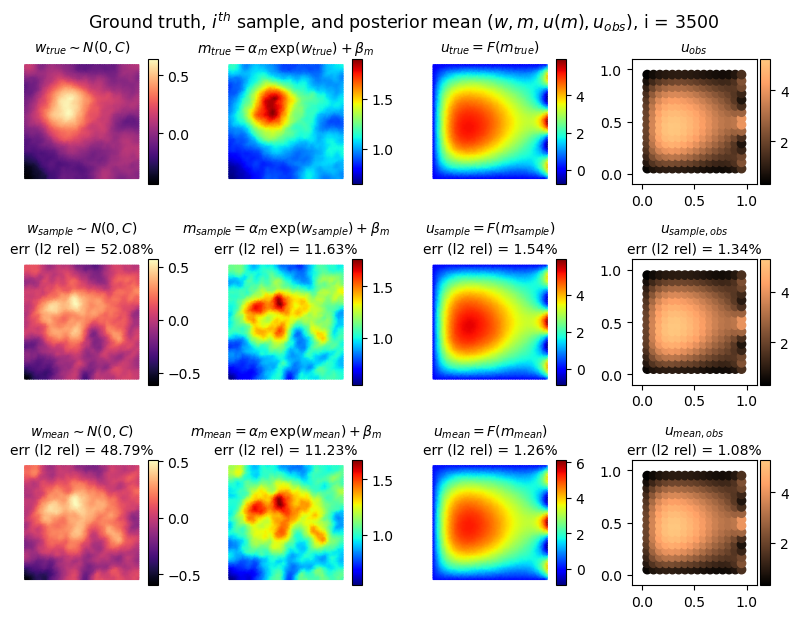

--------------------------------------------------
Sample: 4100, Accepted samples:   46, Acceptance Rate: 1.122e-02, Cost mean: 1.316e+01. 
Tracing 100 samples took 3.552e+01s
Error (%) in w: ||w - w_mean|| = 4.863e+01, ||w - w_sample|| = 5.849e+01
Error (%) in m: ||m - m_mean|| = 1.119e+01, ||m - m_sample|| = 1.329e+01
Error (%) in u: ||u - u_mean|| = 1.255e+00, ||u - u_sample|| = 1.877e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.077e+00, ||u_obs - u_obs_sample|| = 1.638e+00
--------------------------------------------------
--------------------------------------------------
Sample: 4200, Accepted samples:   51, Acceptance Rate: 1.214e-02, Cost mean: 1.327e+01. 
Tracing 100 samples took 3.174e+01s
Error (%) in w: ||w - w_mean|| = 4.852e+01, ||w - w_sample|| = 6.526e+01
Error (%) in m: ||m - m_mean|| = 1.119e+01, ||m - m_sample|| = 1.543e+01
Error (%) in u: ||u - u_mean|| = 1.241e+00, ||u - u_sample|| = 1.532e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.073e+00, ||u_obs - 

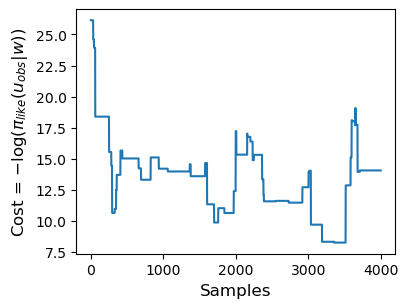

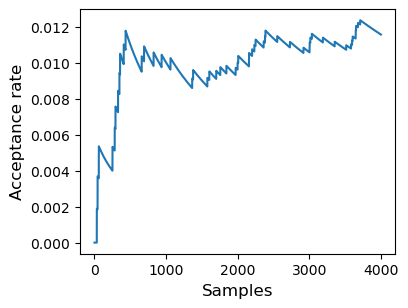

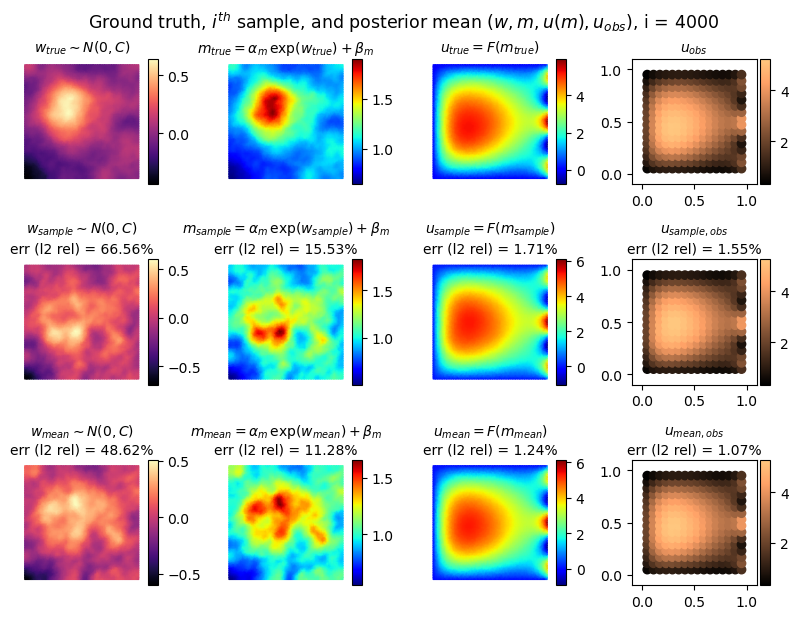

--------------------------------------------------
Sample: 4600, Accepted samples:   52, Acceptance Rate: 1.130e-02, Cost mean: 1.335e+01. 
Tracing 100 samples took 3.585e+01s
Error (%) in w: ||w - w_mean|| = 4.871e+01, ||w - w_sample|| = 6.656e+01
Error (%) in m: ||m - m_mean|| = 1.131e+01, ||m - m_sample|| = 1.553e+01
Error (%) in u: ||u - u_mean|| = 1.240e+00, ||u - u_sample|| = 1.712e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.067e+00, ||u_obs - u_obs_sample|| = 1.546e+00
--------------------------------------------------
--------------------------------------------------
Sample: 4700, Accepted samples:   52, Acceptance Rate: 1.106e-02, Cost mean: 1.336e+01. 
Tracing 100 samples took 3.262e+01s
Error (%) in w: ||w - w_mean|| = 4.881e+01, ||w - w_sample|| = 6.656e+01
Error (%) in m: ||m - m_mean|| = 1.135e+01, ||m - m_sample|| = 1.553e+01
Error (%) in u: ||u - u_mean|| = 1.241e+00, ||u - u_sample|| = 1.712e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.067e+00, ||u_obs - 

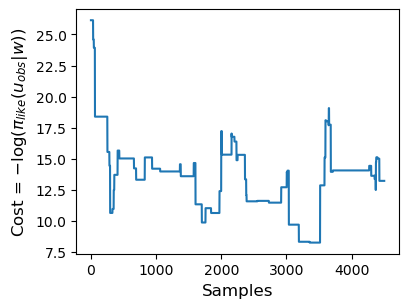

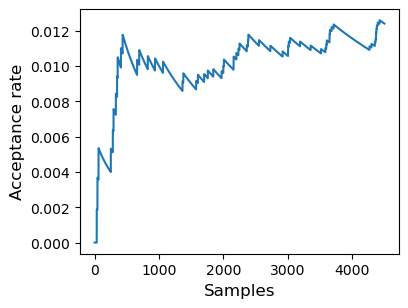

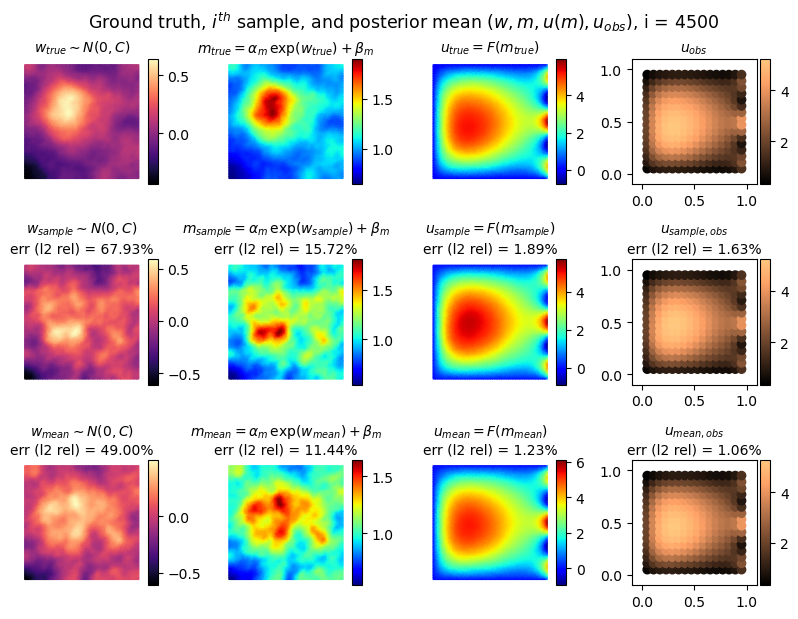

--------------------------------------------------
Sample: 5100, Accepted samples:   65, Acceptance Rate: 1.275e-02, Cost mean: 1.341e+01. 
Tracing 100 samples took 3.716e+01s
Error (%) in w: ||w - w_mean|| = 4.904e+01, ||w - w_sample|| = 6.482e+01
Error (%) in m: ||m - m_mean|| = 1.146e+01, ||m - m_sample|| = 1.483e+01
Error (%) in u: ||u - u_mean|| = 1.231e+00, ||u - u_sample|| = 1.976e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.064e+00, ||u_obs - u_obs_sample|| = 1.800e+00
--------------------------------------------------
--------------------------------------------------
Sample: 5200, Accepted samples:   66, Acceptance Rate: 1.269e-02, Cost mean: 1.344e+01. 
Tracing 100 samples took 3.328e+01s
Error (%) in w: ||w - w_mean|| = 4.906e+01, ||w - w_sample|| = 6.748e+01
Error (%) in m: ||m - m_mean|| = 1.148e+01, ||m - m_sample|| = 1.524e+01
Error (%) in u: ||u - u_mean|| = 1.231e+00, ||u - u_sample|| = 1.927e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.065e+00, ||u_obs - 

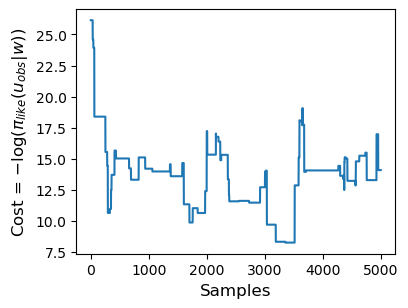

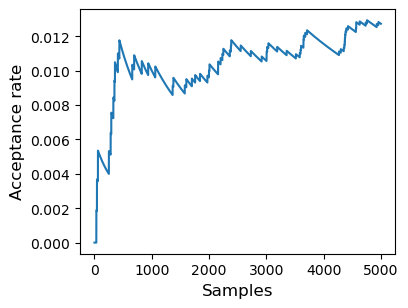

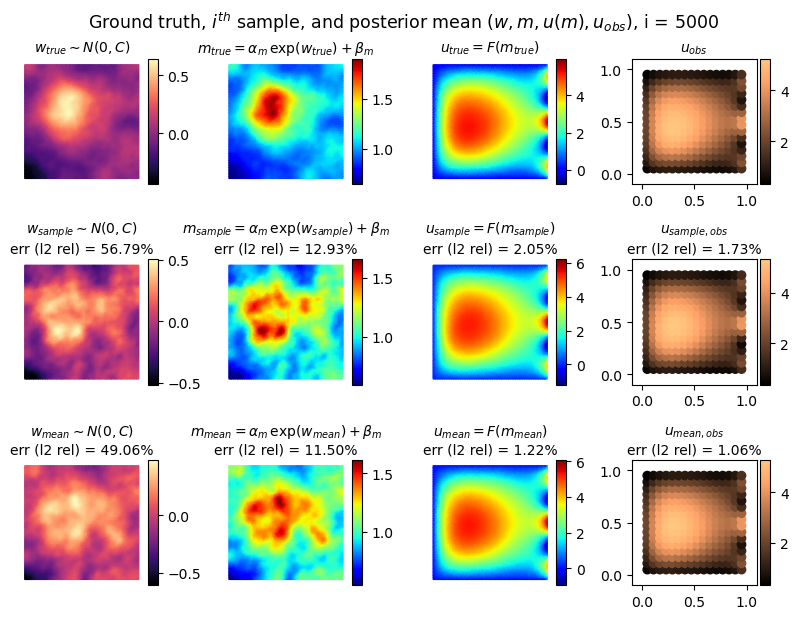

--------------------------------------------------
Sample: 5600, Accepted samples:   73, Acceptance Rate: 1.304e-02, Cost mean: 1.345e+01. 
Tracing 100 samples took 3.805e+01s
Error (%) in w: ||w - w_mean|| = 4.892e+01, ||w - w_sample|| = 5.728e+01
Error (%) in m: ||m - m_mean|| = 1.148e+01, ||m - m_sample|| = 1.272e+01
Error (%) in u: ||u - u_mean|| = 1.222e+00, ||u - u_sample|| = 1.707e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.055e+00, ||u_obs - u_obs_sample|| = 1.472e+00
--------------------------------------------------
--------------------------------------------------
Sample: 5700, Accepted samples:   73, Acceptance Rate: 1.281e-02, Cost mean: 1.338e+01. 
Tracing 100 samples took 3.380e+01s
Error (%) in w: ||w - w_mean|| = 4.880e+01, ||w - w_sample|| = 5.728e+01
Error (%) in m: ||m - m_mean|| = 1.145e+01, ||m - m_sample|| = 1.272e+01
Error (%) in u: ||u - u_mean|| = 1.221e+00, ||u - u_sample|| = 1.707e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.053e+00, ||u_obs - 

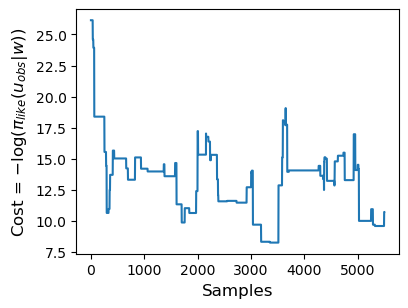

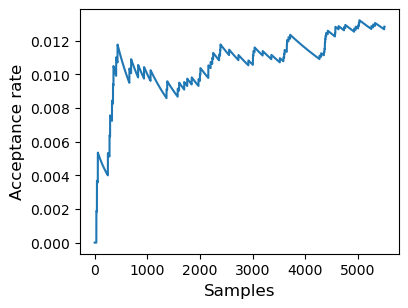

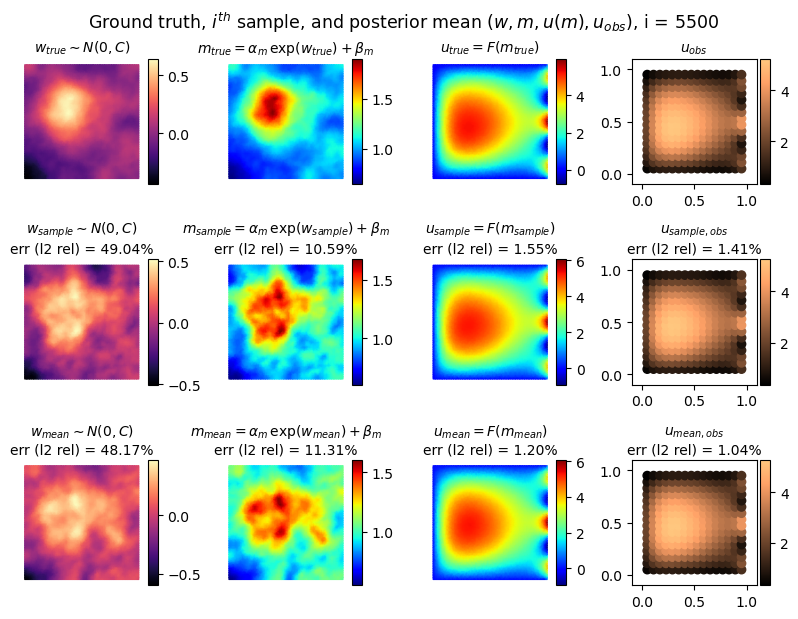

--------------------------------------------------
Sample: 6100, Accepted samples:   77, Acceptance Rate: 1.262e-02, Cost mean: 1.314e+01. 
Tracing 100 samples took 3.745e+01s
Error (%) in w: ||w - w_mean|| = 4.789e+01, ||w - w_sample|| = 4.904e+01
Error (%) in m: ||m - m_mean|| = 1.125e+01, ||m - m_sample|| = 1.059e+01
Error (%) in u: ||u - u_mean|| = 1.188e+00, ||u - u_sample|| = 1.547e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.030e+00, ||u_obs - u_obs_sample|| = 1.414e+00
--------------------------------------------------
--------------------------------------------------
Sample: 6200, Accepted samples:   78, Acceptance Rate: 1.258e-02, Cost mean: 1.309e+01. 
Tracing 100 samples took 3.414e+01s
Error (%) in w: ||w - w_mean|| = 4.765e+01, ||w - w_sample|| = 5.386e+01
Error (%) in m: ||m - m_mean|| = 1.120e+01, ||m - m_sample|| = 1.177e+01
Error (%) in u: ||u - u_mean|| = 1.179e+00, ||u - u_sample|| = 1.476e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.026e+00, ||u_obs - 

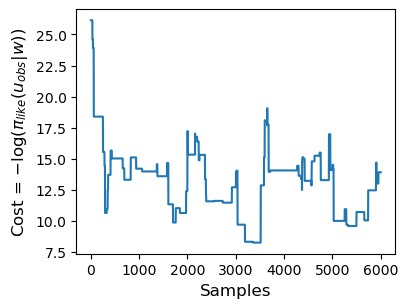

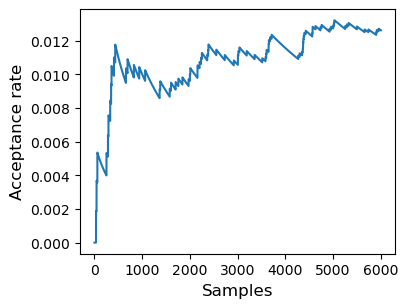

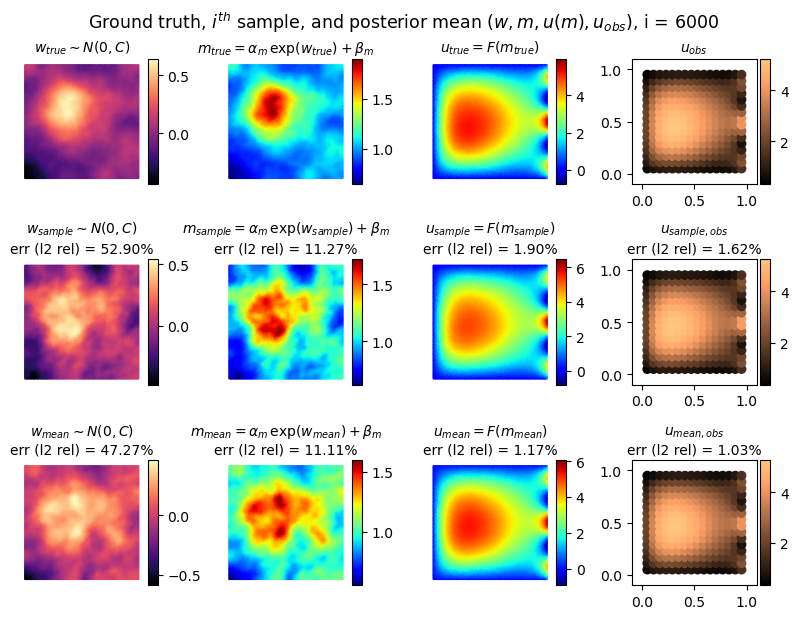

--------------------------------------------------
Sample: 6600, Accepted samples:   83, Acceptance Rate: 1.258e-02, Cost mean: 1.303e+01. 
Tracing 100 samples took 3.876e+01s
Error (%) in w: ||w - w_mean|| = 4.711e+01, ||w - w_sample|| = 5.361e+01
Error (%) in m: ||m - m_mean|| = 1.106e+01, ||m - m_sample|| = 1.124e+01
Error (%) in u: ||u - u_mean|| = 1.171e+00, ||u - u_sample|| = 1.897e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.026e+00, ||u_obs - u_obs_sample|| = 1.593e+00
--------------------------------------------------
--------------------------------------------------
Sample: 6700, Accepted samples:   85, Acceptance Rate: 1.269e-02, Cost mean: 1.303e+01. 
Tracing 100 samples took 3.547e+01s
Error (%) in w: ||w - w_mean|| = 4.698e+01, ||w - w_sample|| = 5.241e+01
Error (%) in m: ||m - m_mean|| = 1.103e+01, ||m - m_sample|| = 1.149e+01
Error (%) in u: ||u - u_mean|| = 1.172e+00, ||u - u_sample|| = 1.893e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.028e+00, ||u_obs - 

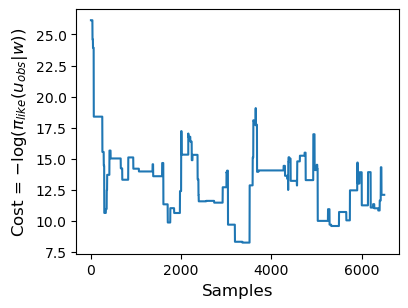

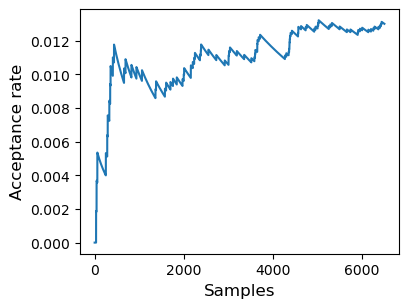

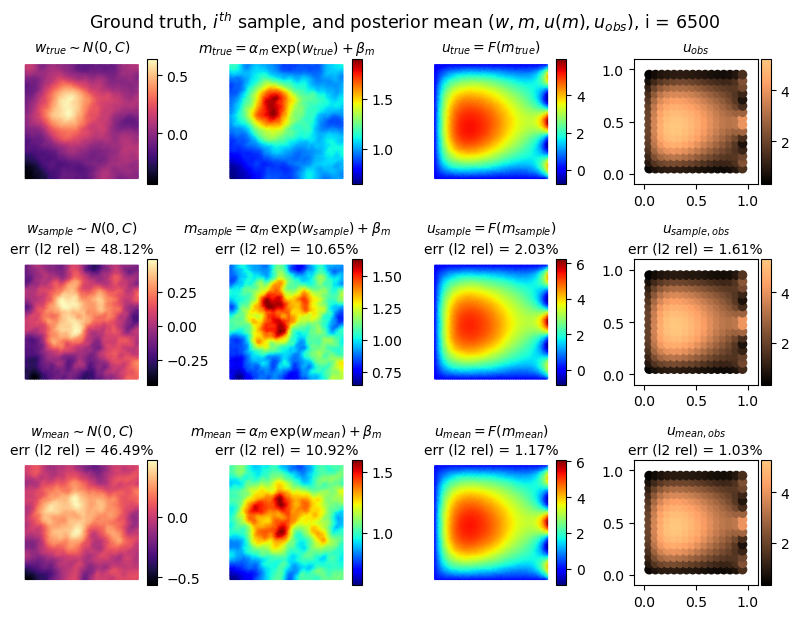

--------------------------------------------------
Sample: 7100, Accepted samples:   92, Acceptance Rate: 1.296e-02, Cost mean: 1.294e+01. 
Tracing 100 samples took 3.956e+01s
Error (%) in w: ||w - w_mean|| = 4.629e+01, ||w - w_sample|| = 4.678e+01
Error (%) in m: ||m - m_mean|| = 1.088e+01, ||m - m_sample|| = 1.039e+01
Error (%) in u: ||u - u_mean|| = 1.167e+00, ||u - u_sample|| = 1.973e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.028e+00, ||u_obs - u_obs_sample|| = 1.591e+00
--------------------------------------------------
--------------------------------------------------
Sample: 7200, Accepted samples:   95, Acceptance Rate: 1.319e-02, Cost mean: 1.295e+01. 
Tracing 100 samples took 3.553e+01s
Error (%) in w: ||w - w_mean|| = 4.605e+01, ||w - w_sample|| = 4.596e+01
Error (%) in m: ||m - m_mean|| = 1.083e+01, ||m - m_sample|| = 1.018e+01
Error (%) in u: ||u - u_mean|| = 1.162e+00, ||u - u_sample|| = 1.527e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.024e+00, ||u_obs - 

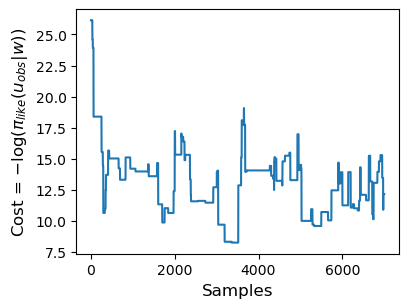

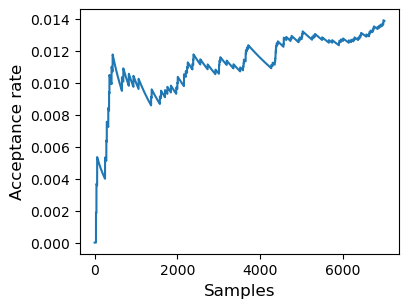

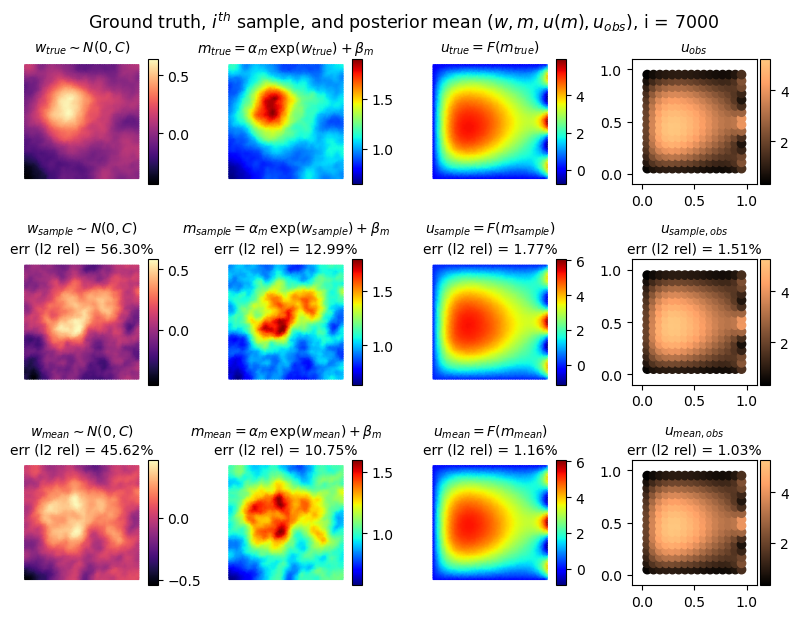

--------------------------------------------------
Sample: 7600, Accepted samples:  104, Acceptance Rate: 1.368e-02, Cost mean: 1.296e+01. 
Tracing 100 samples took 3.924e+01s
Error (%) in w: ||w - w_mean|| = 4.553e+01, ||w - w_sample|| = 5.630e+01
Error (%) in m: ||m - m_mean|| = 1.073e+01, ||m - m_sample|| = 1.299e+01
Error (%) in u: ||u - u_mean|| = 1.162e+00, ||u - u_sample|| = 1.768e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.024e+00, ||u_obs - u_obs_sample|| = 1.512e+00
--------------------------------------------------
--------------------------------------------------
Sample: 7700, Accepted samples:  106, Acceptance Rate: 1.377e-02, Cost mean: 1.294e+01. 
Tracing 100 samples took 3.582e+01s
Error (%) in w: ||w - w_mean|| = 4.544e+01, ||w - w_sample|| = 5.833e+01
Error (%) in m: ||m - m_mean|| = 1.072e+01, ||m - m_sample|| = 1.376e+01
Error (%) in u: ||u - u_mean|| = 1.161e+00, ||u - u_sample|| = 1.624e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.025e+00, ||u_obs - 

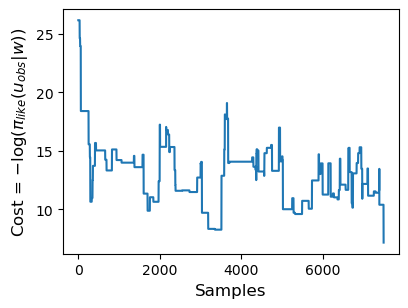

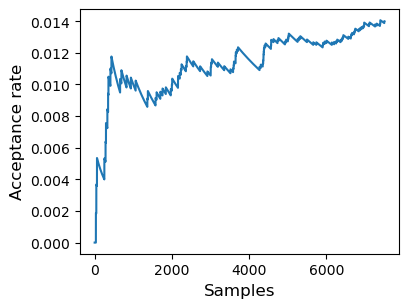

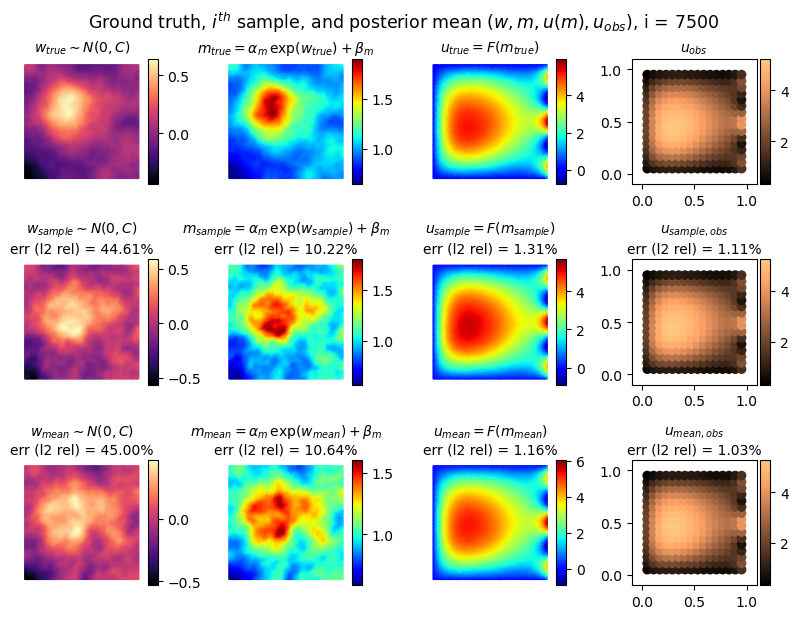

--------------------------------------------------
Sample: 8100, Accepted samples:  112, Acceptance Rate: 1.383e-02, Cost mean: 1.279e+01. 
Tracing 100 samples took 3.938e+01s
Error (%) in w: ||w - w_mean|| = 4.481e+01, ||w - w_sample|| = 4.461e+01
Error (%) in m: ||m - m_mean|| = 1.059e+01, ||m - m_sample|| = 1.022e+01
Error (%) in u: ||u - u_mean|| = 1.152e+00, ||u - u_sample|| = 1.311e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.024e+00, ||u_obs - u_obs_sample|| = 1.113e+00
--------------------------------------------------
--------------------------------------------------
Sample: 8200, Accepted samples:  112, Acceptance Rate: 1.366e-02, Cost mean: 1.271e+01. 
Tracing 100 samples took 3.592e+01s
Error (%) in w: ||w - w_mean|| = 4.462e+01, ||w - w_sample|| = 4.461e+01
Error (%) in m: ||m - m_mean|| = 1.055e+01, ||m - m_sample|| = 1.022e+01
Error (%) in u: ||u - u_mean|| = 1.145e+00, ||u - u_sample|| = 1.311e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 1.019e+00, ||u_obs - 

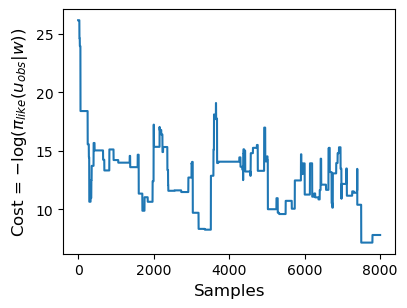

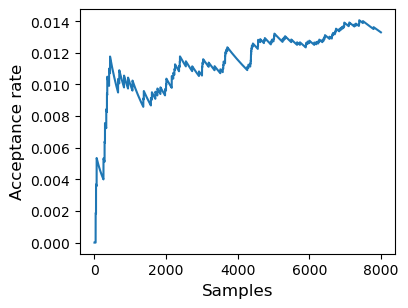

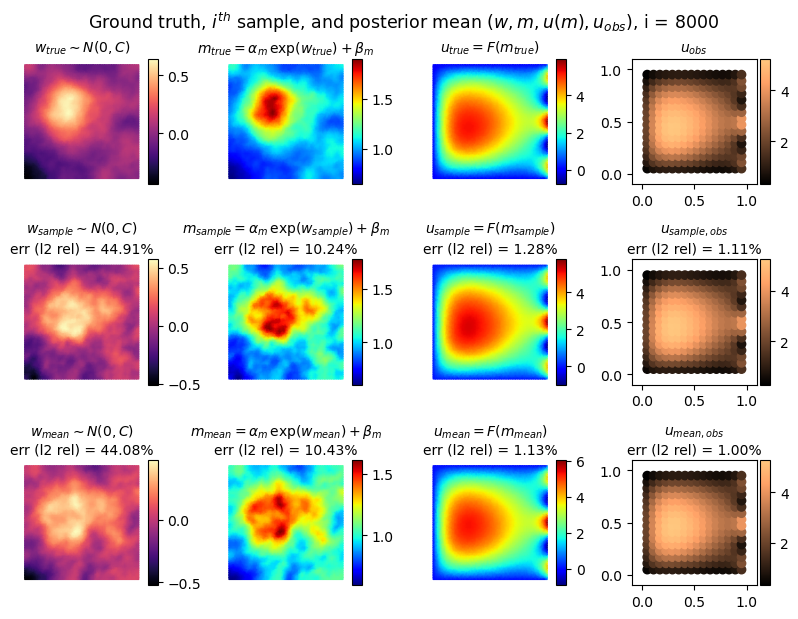

--------------------------------------------------
Sample: 8600, Accepted samples:  114, Acceptance Rate: 1.326e-02, Cost mean: 1.246e+01. 
Tracing 100 samples took 4.021e+01s
Error (%) in w: ||w - w_mean|| = 4.393e+01, ||w - w_sample|| = 4.562e+01
Error (%) in m: ||m - m_mean|| = 1.040e+01, ||m - m_sample|| = 1.058e+01
Error (%) in u: ||u - u_mean|| = 1.121e+00, ||u - u_sample|| = 1.216e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.985e-01, ||u_obs - u_obs_sample|| = 9.885e-01
--------------------------------------------------
--------------------------------------------------
Sample: 8700, Accepted samples:  114, Acceptance Rate: 1.310e-02, Cost mean: 1.240e+01. 
Tracing 100 samples took 3.640e+01s
Error (%) in w: ||w - w_mean|| = 4.380e+01, ||w - w_sample|| = 4.562e+01
Error (%) in m: ||m - m_mean|| = 1.037e+01, ||m - m_sample|| = 1.058e+01
Error (%) in u: ||u - u_mean|| = 1.117e+00, ||u - u_sample|| = 1.216e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.939e-01, ||u_obs - 

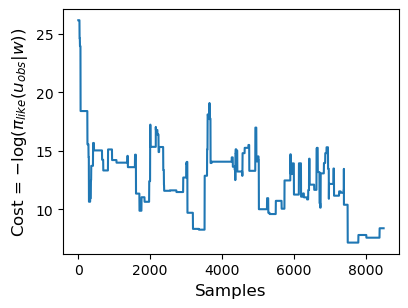

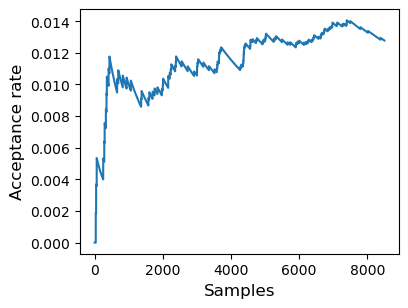

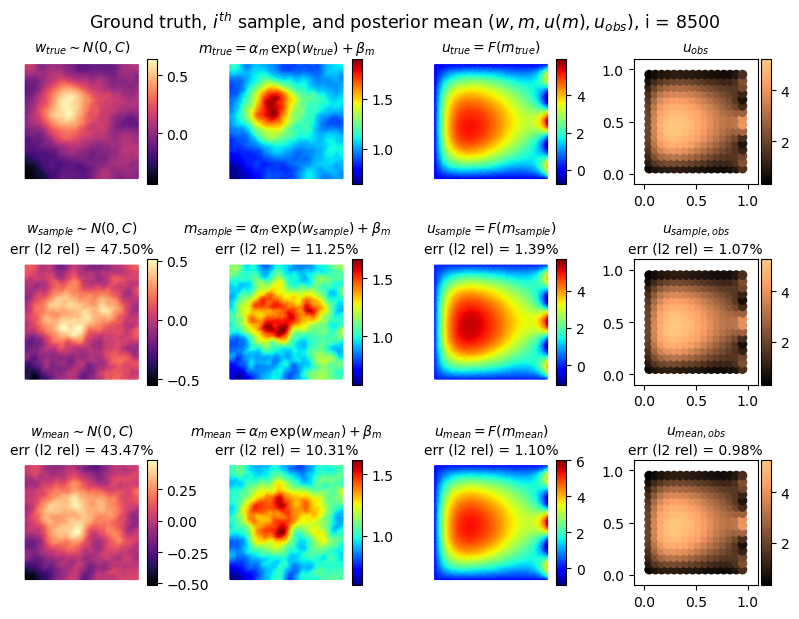

--------------------------------------------------
Sample: 9100, Accepted samples:  116, Acceptance Rate: 1.275e-02, Cost mean: 1.219e+01. 
Tracing 100 samples took 4.050e+01s
Error (%) in w: ||w - w_mean|| = 4.338e+01, ||w - w_sample|| = 4.846e+01
Error (%) in m: ||m - m_mean|| = 1.029e+01, ||m - m_sample|| = 1.151e+01
Error (%) in u: ||u - u_mean|| = 1.096e+00, ||u - u_sample|| = 1.398e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.765e-01, ||u_obs - u_obs_sample|| = 1.164e+00
--------------------------------------------------
--------------------------------------------------
Sample: 9200, Accepted samples:  118, Acceptance Rate: 1.283e-02, Cost mean: 1.217e+01. 
Tracing 100 samples took 3.665e+01s
Error (%) in w: ||w - w_mean|| = 4.328e+01, ||w - w_sample|| = 4.795e+01
Error (%) in m: ||m - m_mean|| = 1.028e+01, ||m - m_sample|| = 1.122e+01
Error (%) in u: ||u - u_mean|| = 1.091e+00, ||u - u_sample|| = 1.782e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.752e-01, ||u_obs - 

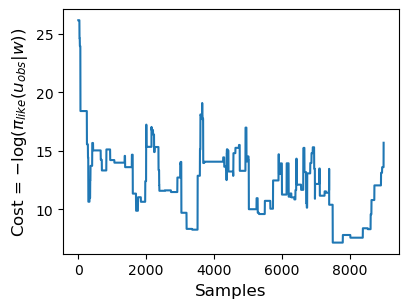

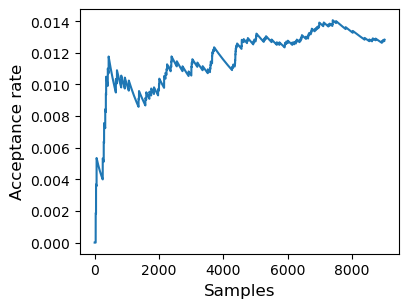

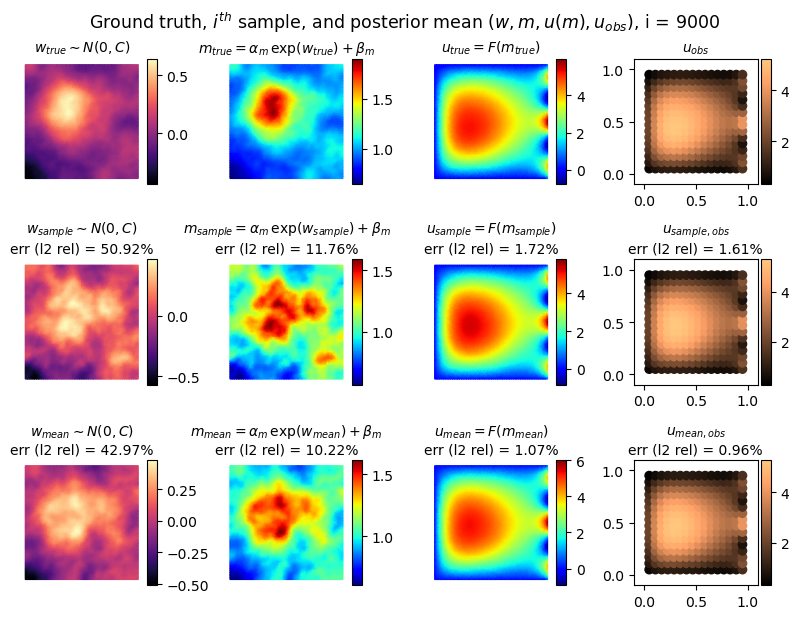

--------------------------------------------------
Sample: 9600, Accepted samples:  123, Acceptance Rate: 1.281e-02, Cost mean: 1.220e+01. 
Tracing 100 samples took 4.157e+01s
Error (%) in w: ||w - w_mean|| = 4.287e+01, ||w - w_sample|| = 4.743e+01
Error (%) in m: ||m - m_mean|| = 1.021e+01, ||m - m_sample|| = 1.093e+01
Error (%) in u: ||u - u_mean|| = 1.064e+00, ||u - u_sample|| = 1.688e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.606e-01, ||u_obs - u_obs_sample|| = 1.484e+00
--------------------------------------------------
--------------------------------------------------
Sample: 9700, Accepted samples:  125, Acceptance Rate: 1.289e-02, Cost mean: 1.220e+01. 
Tracing 100 samples took 3.748e+01s
Error (%) in w: ||w - w_mean|| = 4.273e+01, ||w - w_sample|| = 4.607e+01
Error (%) in m: ||m - m_mean|| = 1.018e+01, ||m - m_sample|| = 1.068e+01
Error (%) in u: ||u - u_mean|| = 1.058e+00, ||u - u_sample|| = 1.768e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.583e-01, ||u_obs - 

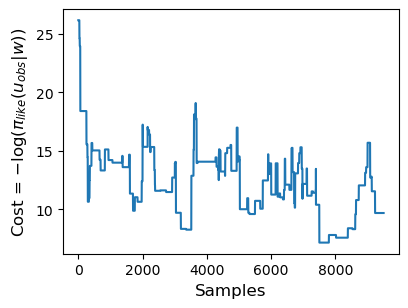

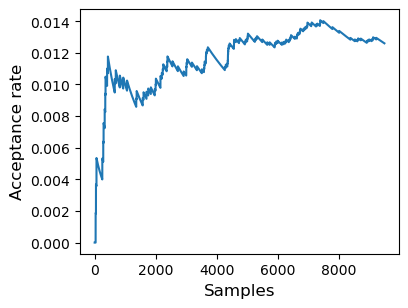

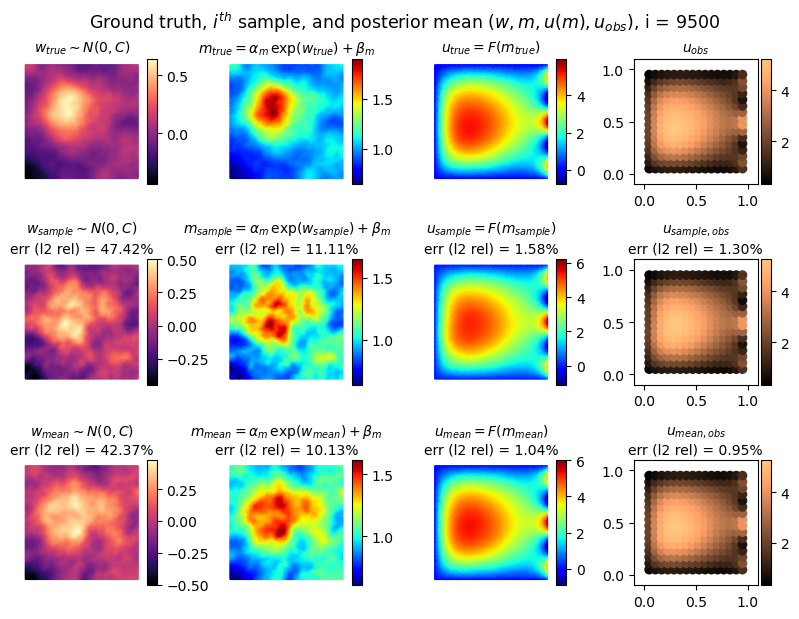

--------------------------------------------------
Sample: 10100, Accepted samples:  127, Acceptance Rate: 1.257e-02, Cost mean: 1.210e+01. 
Tracing 100 samples took 4.196e+01s
Error (%) in w: ||w - w_mean|| = 4.227e+01, ||w - w_sample|| = 4.795e+01
Error (%) in m: ||m - m_mean|| = 1.011e+01, ||m - m_sample|| = 1.124e+01
Error (%) in u: ||u - u_mean|| = 1.042e+00, ||u - u_sample|| = 1.543e+00
Error (%) in u_obs: ||u_obs - u_obs_mean|| = 9.501e-01, ||u_obs - u_obs_sample|| = 1.330e+00
--------------------------------------------------


KeyboardInterrupt: 

In [18]:
mcmc.surrogate_to_use = 'FNO'

if mcmc.surrogate_to_use is not None:
    savepath = savepath_base + '_surrogate_{}/'.format(mcmc.surrogate_to_use)
else:
    savepath = savepath_base + '/'

os.makedirs(savepath, exist_ok = True)

savefilename = 'tracer'

run_mcmc = True
if run_mcmc:
    mcmc.run(n_samples = n_samples, n_burnin = n_burnin, \
         pcn_beta = pcn_beta, sigma_noise = sigma_noise, \
         print_every = print_every, print_lvl = 2, \
         display_plot_every = display_plot_every, \
         savefilename = savefilename, \
         savepath = savepath, init_tracer = True)

## Load tracer and plot

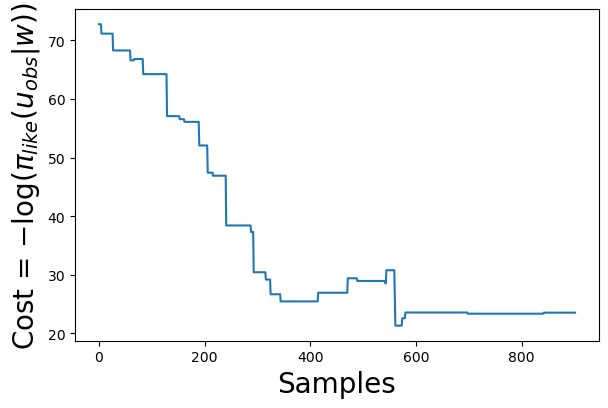

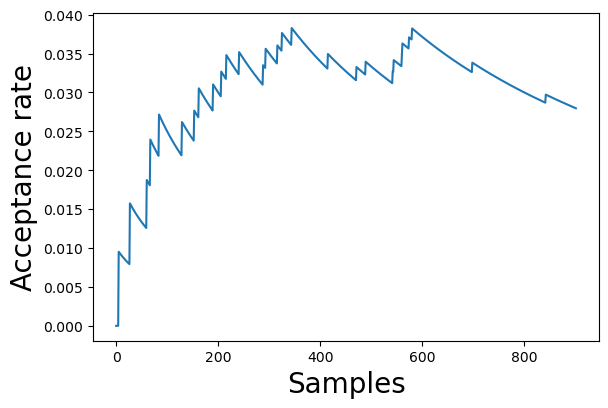

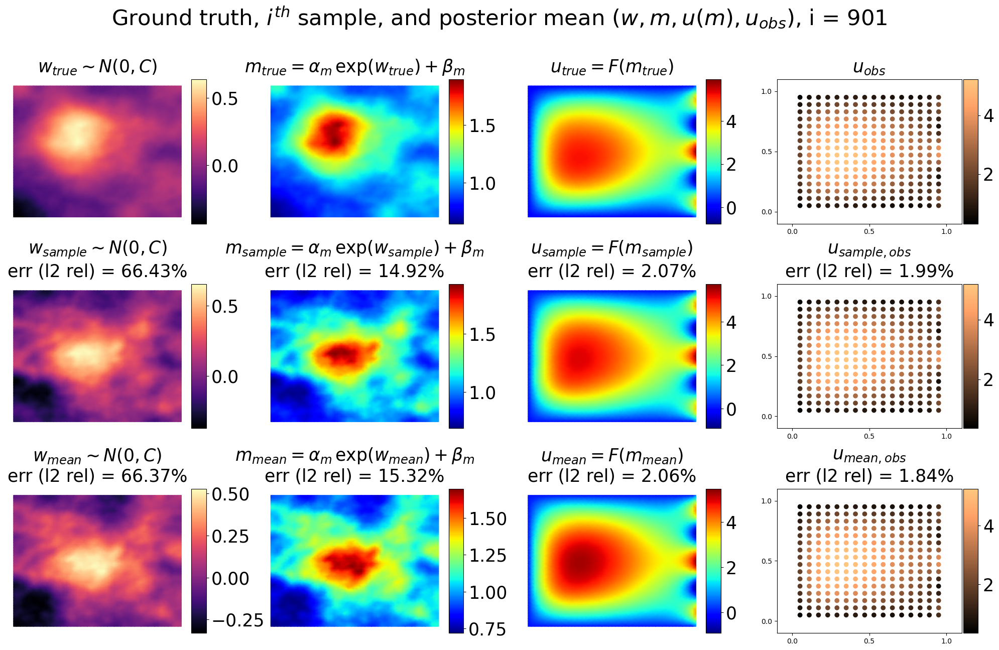

In [ ]:
load_tracer = pickle.load(open(savepath + 'tracer' + '.pkl', 'rb'))

load_tracer.acceptances, load_tracer.current_acceptance_rate

savefig = False
plot_curve(load_tracer.accepted_samples_cost, xl=r'Samples', \
        yl= r'Cost = $-\log(\pi_{like}(u_{obs} | w))$', \
        fs = 20, lw = 3, figsize=[6,4])

plot_curve(load_tracer.acceptance_rate, xl=r'Samples', \
        yl= r'Acceptance rate', \
        fs = 20, lw = 3, figsize=[6,4])


w_mean = load_tracer.accepted_samples_mean_m
w_sample_i = len(load_tracer.accepted_samples_m) - 1
w_sample = load_tracer.accepted_samples_m[w_sample_i]

mcmc_plot_fields_base(w_mean, w_sample, w_sample_i, mcmc, savefilename = None)